# Metastatic Breast Cancer (INSERM, PLoS Med 2016)

*Mutational Profile of Metastatic Breast Cancers: A Retrospective Analysis* Lefebvre et al.

The analysis aims to decipher mutational profiles of **Metastatic Breast Cancer (mBC)** using next-generation sequencing. **Whole-exome sequencing** was performed on **216 tumor–blood pairs** from mBC patients who underwent a biopsy. Mutational profiles from 772 primary breast tumors from The Cancer Genome Atlas (TCGA) were used as a reference for comparing primary and mBC mutational profiles.
The study allowed identification of the affected genes and of mutational signatures that were more prevalent in metastatic as compared with primary tumors and that may be involved in the resistance to therapies.
Twelve genes (TP53, PIK3CA, GATA3, ESR1, MAP3K1, CDH1, AKT1, MAP2K4, RB1, PTEN, CBFB, and CDKN2A) were identified as significantly mutated in mBC (false discovery rate < 0.1). Eight genes (ESR1, FSIP2, FRAS1, OSBPL3, EDC4, PALB2, IGFN1, and AGRN) were more frequently mutated in mBC as compared to early BC (FDR < 0.01). ESR1 was identified both as a driver and as a metastatic gene.

The identification of mutational and copy number alterations specifically involved in breast cancer metastasis demonstrated that tumors evolve under the pressure of therapy.

In [6]:
import os

In [7]:
os.chdir("C:/Users/Cristina/OneDrive/Documenti/BCG/Tesi/Datasets/Metastatic Breast Cancer (INSERM, PLoS Med 2016)")

In [8]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import ydata_profiling as yp
from ydata_profiling import ProfileReport

## Patients clinical data 

In [9]:
data_clinical_patient=pd.read_csv('data_clinical_patient.csv', sep=None, engine='python')
data_clinical_patient

,PATIENT_ID,SEX,STUDY_ID
0,MBC_182,Female,SHIVA
1,MBC_183,Female,SHIVA
2,MBC_184,Female,SHIVA
3,MBC_185,Female,SHIVA
4,MBC_186,Female,SHIVA
...,...,...,...
211,MBC_76,Female,SAFIR02
212,MBC_77,Female,SAFIR02
213,MBC_78,Female,SAFIR02
214,MBC_79,Female,SAFIR02


In [10]:
profile_patient = ProfileReport(data_clinical_patient, title="Pandas Profiling Report")

In [11]:
profile_patient 

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

The patients are 216 and they are all females. For each of the patient, the prospective study is indicated: SAFIR01, SAFIR02, SHIVA, or Molecular
Screening for Cancer Treatment Optimization (MOSCATO). SAFIR01 included patients ith metastatic breast cancers resistant to therapy, and SHIVA and MOSCATO included patients with metastatic cancers eligible for phase I trial, while SAFIR02 included patients with metastatic breast cancers who were starting first- or second-line chemotherapy. 

## Samples clinical data 

In [12]:
data_clinical_sample=pd.read_csv('data_clinical_sample.csv', sep=None, engine='python')
print(data_clinical_sample)

    SAMPLE_ID PATIENT_ID   IHC_HER2    CANCER_TYPE       CANCER_TYPE_DETAILED  \
0     MBC_182    MBC_182  HR-/HER2-  Breast Cancer  Invasive Breast Carcinoma   
1     MBC_183    MBC_183  HR+/HER2-  Breast Cancer  Invasive Breast Carcinoma   
2     MBC_184    MBC_184  HR+/HER2-  Breast Cancer  Invasive Breast Carcinoma   
3     MBC_185    MBC_185  HR+/HER2-  Breast Cancer  Invasive Breast Carcinoma   
4     MBC_186    MBC_186  HR+/HER2-  Breast Cancer  Invasive Breast Carcinoma   
..        ...        ...        ...            ...                        ...   
211    MBC_76     MBC_76  HR+/HER2-  Breast Cancer  Invasive Breast Carcinoma   
212    MBC_77     MBC_77  HR+/HER2-  Breast Cancer  Invasive Breast Carcinoma   
213    MBC_78     MBC_78  HR+/HER2-  Breast Cancer  Invasive Breast Carcinoma   
214    MBC_79     MBC_79  HR+/HER2-  Breast Cancer  Invasive Breast Carcinoma   
215    MBC_80     MBC_80  HR-/HER2-  Breast Cancer  Invasive Breast Carcinoma   

    ONCOTREE_CODE SAMPLE_TY

In [13]:
profile_sample = ProfileReport(data_clinical_sample, title="Pandas Profiling Report")

In [14]:
profile_sample

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

The number of samples is equal to the number of patients (216). 
For each sample, the hormone receptor status is indicated: the 66.2% of them is HR+/HER2-. The breast cancer is invasive for all the samples.  

In [15]:
# keep only the relevant variables
data_clinical_sample_relevant=data_clinical_sample.drop(['ONCOTREE_CODE', 'CANCER_TYPE', 'CANCER_TYPE_DETAILED', 'SOMATIC_STATUS'],axis=1)
data_clinical_sample_relevant

,SAMPLE_ID,PATIENT_ID,IHC_HER2,SAMPLE_TYPE,TMB_NONSYNONYMOUS
0,MBC_182,MBC_182,HR-/HER2-,Metastasis,5.333.333.333
1,MBC_183,MBC_183,HR+/HER2-,Metastasis,2.933.333.333
2,MBC_184,MBC_184,HR+/HER2-,Metastasis,1.033.333.333
3,MBC_185,MBC_185,HR+/HER2-,Metastasis,1.933.333.333
4,MBC_186,MBC_186,HR+/HER2-,Metastasis,0.533333333
...,...,...,...,...,...
211,MBC_76,MBC_76,HR+/HER2-,Metastasis,1.133.333.333
212,MBC_77,MBC_77,HR+/HER2-,Metastasis,0.8
213,MBC_78,MBC_78,HR+/HER2-,Metastasis,4.233.333.333
214,MBC_79,MBC_79,HR+/HER2-,Metastasis,4.666.666.667


In [16]:
patient_ID = data_clinical_sample_relevant[['PATIENT_ID']]
patient_ID

,PATIENT_ID
0,MBC_182
1,MBC_183
2,MBC_184
3,MBC_185
4,MBC_186
...,...
211,MBC_76
212,MBC_77
213,MBC_78
214,MBC_79


### Select TNBC patients 

In [17]:
TN_pts=data_clinical_sample_relevant.loc[data_clinical_sample_relevant['IHC_HER2']=='HR-/HER2-']
TN_pts

,SAMPLE_ID,PATIENT_ID,IHC_HER2,SAMPLE_TYPE,TMB_NONSYNONYMOUS
0,MBC_182,MBC_182,HR-/HER2-,Metastasis,5.333.333.333
13,MBC_195,MBC_195,HR-/HER2-,Metastasis,0.733333333
22,MBC_204,MBC_204,HR-/HER2-,Metastasis,5.5
23,MBC_205,MBC_205,HR-/HER2-,Metastasis,4.3
24,MBC_206,MBC_206,HR-/HER2-,Metastasis,0.966666667
26,MBC_208,MBC_208,HR-/HER2-,Metastasis,2.733.333.333
33,MBC_215,MBC_215,HR-/HER2-,Metastasis,1.166.666.667
39,MBC_85,MBC_85,HR-/HER2-,Metastasis,2.166.666.667
41,MBC_87,MBC_87,HR-/HER2-,Metastasis,1.633.333.333
45,MBC_91,MBC_91,HR-/HER2-,Metastasis,2.2


In [18]:
len(TN_pts)

51

In [19]:
TN_pts = TN_pts[['PATIENT_ID']]
TN_pts

,PATIENT_ID
0,MBC_182
13,MBC_195
22,MBC_204
23,MBC_205
24,MBC_206
26,MBC_208
33,MBC_215
39,MBC_85
41,MBC_87
45,MBC_91


In [20]:
# select the patients not TN
x = pd.concat([TN_pts, patient_ID])
NON_TN_pts= x.drop_duplicates(keep=False, inplace=False)
NON_TN_pts

,PATIENT_ID
1,MBC_183
2,MBC_184
3,MBC_185
4,MBC_186
5,MBC_187
...,...
210,MBC_75
211,MBC_76
212,MBC_77
213,MBC_78


## Mutational data

In [21]:
data_mutation=pd.read_csv('data_mutations_final.csv', sep=None, engine='python')
print(data_mutation)

      Hugo_Symbol  Entrez_Gene_Id Center NCBI_Build Chromosome  \
0          VWA5B1             NaN     GR     GRCh37          1   
1            GJB5             NaN     GR     GRCh37          1   
2           LPHN2             NaN     GR     GRCh37          1   
3             FLG             NaN     GR     GRCh37          1   
4          PRSS38             NaN     GR     GRCh37          1   
...           ...             ...    ...        ...        ...   
22944        TP53             NaN     GR     GRCh37         17   
22945         TTN             NaN     GR     GRCh37          2   
22946        ZASP             NaN     GR     GRCh37          7   
22947    NEBL-AS1     100128511.0     GR     GRCh37         10   
22948     HEATR5A             NaN     GR     GRCh37         14   

       Start_Position  End_Position Strand              Consequence  \
0            20639336      20639336      +       synonymous_variant   
1            35223738      35223738      +         missense_varia

In [22]:
data_mutation.isin(['ago-03']).any().any()

False

In [23]:
data_mutation.isin(['AGO3']).any().any()

True

In [24]:
profile_mutation = ProfileReport(data_mutation, title="Pandas Profiling Report")

In [25]:
profile_mutation

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

The MAF file contains 22949 observations (rows) and the mutated distinct genes are 10798. 

The reference genome used for the alignment (NCBI_Build) is GRCh37 for all the observations.

All the 23 chromosomes harbor mutations, even the sexual chromosome X.
**For SNPs, the Start_Position=End_Position.**
The 58% of the mutations are missense and for the 94.8% they are SNPs. 

Whole-exome sequencing for a total of 216 pairs of metastatic tumor was performed using Illumina HiSeq technology.

Protein position variables has 9.8% of missing values (2259 samples).

The variant frequency of the normal allele and the variant frequency of the tumor allele are present, with an average value respectively of 0.0006 (normal allele) and of 0.27 (tumor allele). 

In [26]:
# select the relevant variables from the MAF file
data_mutation_final=data_mutation[['Tumor_Sample_Barcode','Hugo_Symbol', 'Chromosome', 'Start_Position', 'End_Position', 'Variant_Classification', 'Variant_Type', 'Reference_Allele', 'Tumor_Seq_Allele1', 'Tumor_Seq_Allele2', 'HGVSc', 'HGVSp_Short', 'Protein_position', 'Transcript_ID']]
data_mutation_final

,Tumor_Sample_Barcode,Hugo_Symbol,Chromosome,Start_Position,End_Position,Variant_Classification,Variant_Type,Reference_Allele,Tumor_Seq_Allele1,Tumor_Seq_Allele2,HGVSc,HGVSp_Short,Protein_position,Transcript_ID
0,MBC_81,VWA5B1,1,20639336,20639336,Silent,SNP,C,C,T,ENST00000375079.2:c.147C>T,p.F49=,49.0,ENST00000375079
1,MBC_81,GJB5,1,35223738,35223738,Missense_Mutation,SNP,G,G,C,ENST00000338513.1:c.807G>C,p.K269N,269.0,ENST00000338513
2,MBC_81,LPHN2,1,82450942,82450942,Splice_Site,SNP,G,G,C,ENST00000319517.6:c.3361-1G>C,p.X1121_splice,NaN,ENST00000319517
3,MBC_81,FLG,1,152281907,152281907,Missense_Mutation,SNP,A,A,G,ENST00000368799.1:c.5455T>C,p.S1819P,1819.0,ENST00000368799
4,MBC_81,PRSS38,1,228033728,228033728,Missense_Mutation,SNP,G,G,C,ENST00000366757.3:c.800G>C,p.R267P,267.0,ENST00000366757
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
22944,MBC_81,TP53,17,7578483,7578484,Frame_Shift_Del,SNP,G,G,NaN,NaN,NaN,NaN,NaN
22945,MBC_82,TTN,2,179583264,179583265,Frame_Shift_Del,SNP,A,A,NaN,NaN,NaN,NaN,NaN
22946,MBC_24,ZASP,7,100171896,100171897,3'Flank,INS,-,G,G,NaN,NaN,NaN,ENST00000223076
22947,MBC_67,NEBL-AS1,10,21461311,21461312,5'Flank,INS,-,C,C,NaN,NaN,NaN,ENST00000439097


In this dataset sample IDs and patient IDs are equal.

In [27]:
patient_sample=data_clinical_sample.iloc[:,0:2]
patient_sample

,SAMPLE_ID,PATIENT_ID
0,MBC_182,MBC_182
1,MBC_183,MBC_183
2,MBC_184,MBC_184
3,MBC_185,MBC_185
4,MBC_186,MBC_186
...,...,...
211,MBC_76,MBC_76
212,MBC_77,MBC_77
213,MBC_78,MBC_78
214,MBC_79,MBC_79


In [28]:
# adding the patient_ID to the mutation dataset 
data_mutation_sample_pts = data_mutation_final.join(patient_sample.set_index('SAMPLE_ID'), on='Tumor_Sample_Barcode')
data_mutation_sample_pts

,Tumor_Sample_Barcode,Hugo_Symbol,Chromosome,Start_Position,End_Position,Variant_Classification,Variant_Type,Reference_Allele,Tumor_Seq_Allele1,Tumor_Seq_Allele2,HGVSc,HGVSp_Short,Protein_position,Transcript_ID,PATIENT_ID
0,MBC_81,VWA5B1,1,20639336,20639336,Silent,SNP,C,C,T,ENST00000375079.2:c.147C>T,p.F49=,49.0,ENST00000375079,MBC_81
1,MBC_81,GJB5,1,35223738,35223738,Missense_Mutation,SNP,G,G,C,ENST00000338513.1:c.807G>C,p.K269N,269.0,ENST00000338513,MBC_81
2,MBC_81,LPHN2,1,82450942,82450942,Splice_Site,SNP,G,G,C,ENST00000319517.6:c.3361-1G>C,p.X1121_splice,NaN,ENST00000319517,MBC_81
3,MBC_81,FLG,1,152281907,152281907,Missense_Mutation,SNP,A,A,G,ENST00000368799.1:c.5455T>C,p.S1819P,1819.0,ENST00000368799,MBC_81
4,MBC_81,PRSS38,1,228033728,228033728,Missense_Mutation,SNP,G,G,C,ENST00000366757.3:c.800G>C,p.R267P,267.0,ENST00000366757,MBC_81
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
22944,MBC_81,TP53,17,7578483,7578484,Frame_Shift_Del,SNP,G,G,NaN,NaN,NaN,NaN,NaN,MBC_81
22945,MBC_82,TTN,2,179583264,179583265,Frame_Shift_Del,SNP,A,A,NaN,NaN,NaN,NaN,NaN,MBC_82
22946,MBC_24,ZASP,7,100171896,100171897,3'Flank,INS,-,G,G,NaN,NaN,NaN,ENST00000223076,MBC_24
22947,MBC_67,NEBL-AS1,10,21461311,21461312,5'Flank,INS,-,C,C,NaN,NaN,NaN,ENST00000439097,MBC_67


In [29]:
data_mutation_sample_pts=data_mutation_sample_pts[['Tumor_Sample_Barcode', 'PATIENT_ID', 'Hugo_Symbol', 'Chromosome', 'Start_Position', 'End_Position', 'Variant_Classification', 'Variant_Type', 'Reference_Allele', 'Tumor_Seq_Allele1', 'Tumor_Seq_Allele2', 'HGVSc', 'HGVSp_Short', 'Protein_position', 'Transcript_ID']]
data_mutation_sample_pts

,Tumor_Sample_Barcode,PATIENT_ID,Hugo_Symbol,Chromosome,Start_Position,End_Position,Variant_Classification,Variant_Type,Reference_Allele,Tumor_Seq_Allele1,Tumor_Seq_Allele2,HGVSc,HGVSp_Short,Protein_position,Transcript_ID
0,MBC_81,MBC_81,VWA5B1,1,20639336,20639336,Silent,SNP,C,C,T,ENST00000375079.2:c.147C>T,p.F49=,49.0,ENST00000375079
1,MBC_81,MBC_81,GJB5,1,35223738,35223738,Missense_Mutation,SNP,G,G,C,ENST00000338513.1:c.807G>C,p.K269N,269.0,ENST00000338513
2,MBC_81,MBC_81,LPHN2,1,82450942,82450942,Splice_Site,SNP,G,G,C,ENST00000319517.6:c.3361-1G>C,p.X1121_splice,NaN,ENST00000319517
3,MBC_81,MBC_81,FLG,1,152281907,152281907,Missense_Mutation,SNP,A,A,G,ENST00000368799.1:c.5455T>C,p.S1819P,1819.0,ENST00000368799
4,MBC_81,MBC_81,PRSS38,1,228033728,228033728,Missense_Mutation,SNP,G,G,C,ENST00000366757.3:c.800G>C,p.R267P,267.0,ENST00000366757
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
22944,MBC_81,MBC_81,TP53,17,7578483,7578484,Frame_Shift_Del,SNP,G,G,NaN,NaN,NaN,NaN,NaN
22945,MBC_82,MBC_82,TTN,2,179583264,179583265,Frame_Shift_Del,SNP,A,A,NaN,NaN,NaN,NaN,NaN
22946,MBC_24,MBC_24,ZASP,7,100171896,100171897,3'Flank,INS,-,G,G,NaN,NaN,NaN,ENST00000223076
22947,MBC_67,MBC_67,NEBL-AS1,10,21461311,21461312,5'Flank,INS,-,C,C,NaN,NaN,NaN,ENST00000439097


In [30]:
# check if there are some missing transcript IDs
data_mutation_sample_pts['Transcript_ID'].isna().sum()

8

In [31]:
# remove the rows with missing Transcript ID 
data_mutation_sample_pts=data_mutation_sample_pts.dropna(subset=['Transcript_ID'])
data_mutation_sample_pts

,Tumor_Sample_Barcode,PATIENT_ID,Hugo_Symbol,Chromosome,Start_Position,End_Position,Variant_Classification,Variant_Type,Reference_Allele,Tumor_Seq_Allele1,Tumor_Seq_Allele2,HGVSc,HGVSp_Short,Protein_position,Transcript_ID
0,MBC_81,MBC_81,VWA5B1,1,20639336,20639336,Silent,SNP,C,C,T,ENST00000375079.2:c.147C>T,p.F49=,49.0,ENST00000375079
1,MBC_81,MBC_81,GJB5,1,35223738,35223738,Missense_Mutation,SNP,G,G,C,ENST00000338513.1:c.807G>C,p.K269N,269.0,ENST00000338513
2,MBC_81,MBC_81,LPHN2,1,82450942,82450942,Splice_Site,SNP,G,G,C,ENST00000319517.6:c.3361-1G>C,p.X1121_splice,NaN,ENST00000319517
3,MBC_81,MBC_81,FLG,1,152281907,152281907,Missense_Mutation,SNP,A,A,G,ENST00000368799.1:c.5455T>C,p.S1819P,1819.0,ENST00000368799
4,MBC_81,MBC_81,PRSS38,1,228033728,228033728,Missense_Mutation,SNP,G,G,C,ENST00000366757.3:c.800G>C,p.R267P,267.0,ENST00000366757
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
22936,MBC_215,MBC_215,POMT1,9,134379644,134379645,Nonsense_Mutation,INS,-,TGACATCAACT,TGACATCAACT,ENST00000372228.3:c.39_40insTGACATCAACT,p.D14*,13.0,ENST00000372228
22937,MBC_216,MBC_216,NCOR1,17,15983752,15983753,Frame_Shift_Ins,INS,-,C,C,ENST00000268712.3:c.3370dup,p.V1124Gfs*6,1123.0,ENST00000268712
22946,MBC_24,MBC_24,ZASP,7,100171896,100171897,3'Flank,INS,-,G,G,NaN,NaN,NaN,ENST00000223076
22947,MBC_67,MBC_67,NEBL-AS1,10,21461311,21461312,5'Flank,INS,-,C,C,NaN,NaN,NaN,ENST00000439097


In [32]:
# check if there are some missing patient IDs
data_mutation_sample_pts['PATIENT_ID'].isna().sum()

0

In [33]:
# check if there are duplicated rows 
data_mutation_sample_pts.duplicated().sum()

0

In [34]:
data_mutation_sample_pts['Hugo_Symbol'].nunique()

10797

In [35]:
data_mutation_sample_pts['Transcript_ID'].nunique()

10862

### Retrieve the gene lengths through PyEnsembl

In [36]:
## The function Vett_transcript takes all the unique Transcript IDs as indexes and create the column 'Hugo_symbol' filled with zeros 
def Vett_transcript (df_mut):
    vett_transcript_id = df_mut.Transcript_ID.unique()
    df_vett_transcript = pd.DataFrame(index = vett_transcript_id, columns = ['Hugo_Symbol'])
    df_vett_transcript = df_vett_transcript.fillna(0)
    return (df_vett_transcript)

In [37]:
df_vett_transcript = Vett_transcript(data_mutation_sample_pts)
df_vett_transcript 

,Hugo_Symbol
ENST00000375079,0
ENST00000338513,0
ENST00000319517,0
ENST00000368799,0
ENST00000366757,0
...,...
ENST00000326282,0
ENST00000376663,0
ENST00000299481,0
ENST00000439097,0


In [38]:
from pyensembl import EnsemblRelease

# release 77 uses human reference genome GRCh38
# release 75 uses human reference genome GRCh37

data = EnsemblRelease(75)
count=0
def Ricavo_Transcript (df_mutations, df_vett_transcript):
    for index, row in df_mutations.iterrows():
        transcript = row.Transcript_ID
        gene_names = data.gene_name_of_transcript_id(transcript)
        df_vett_transcript.loc[transcript, 'Hugo_Symbol'] = gene_names
        #count = count+1
        #print(count)
    return (df_vett_transcript)

In [39]:
# compute the gene lengths
from pyensembl import EnsemblRelease
import pandas as pd

# release 77 uses human reference genome GRCh38
# release 75 uses human reference genome GRCh37

data = EnsemblRelease(75)

def Lunghezza_geni (index_geni, df_vett_geni):
    for index in index_geni:
        gene_nome = index
        if df_vett_geni.loc[gene_nome, 'Gene_length'] == 0:
            length = 0
            gene_names = data.genes_by_name(gene_nome)
            start = gene_names[0].start
            end = gene_names[0].end
            length = end-start+1
            df_vett_geni.loc[gene_nome, 'Gene_length'] = length
            #count_len = count_len + 1
            #print(length)
            #count_len = count_len + 1
            #print ('count_len:', count_len)

        #count_df = count_df+1
        #print(count_df)
    return(df_vett_geni)

In [40]:
df_vett_transcript = Ricavo_Transcript(data_mutation_sample_pts, df_vett_transcript)
df_vett_transcript

,Hugo_Symbol
ENST00000375079,VWA5B1
ENST00000338513,GJB5
ENST00000319517,LPHN2
ENST00000368799,FLG
ENST00000366757,PRSS38
...,...
ENST00000326282,EID2B
ENST00000376663,BMI1
ENST00000299481,NLRP14
ENST00000439097,NEBL-AS1


In [41]:
# creating a vector to put in the length of each gene, given the Hugo symbol
def Vett_geni (df_vett_transcript):
    index_geni = df_vett_transcript.Hugo_Symbol.unique()
    df_vett_geni = pd.DataFrame(index = index_geni, columns = ['Gene_length'])
    df_vett_geni = df_vett_geni.fillna(0)
    return (df_vett_geni, index_geni)

In [42]:
df_vett_geni, index_geni = Vett_geni(df_vett_transcript)
df_vett_geni

,Gene_length
VWA5B1,0
GJB5,0
LPHN2,0
FLG,0
PRSS38,0
...,...
EID2B,0
BMI1,0
NLRP14,0
NEBL-AS1,0


In [43]:
# compute the gene lengths
from pyensembl import EnsemblRelease
import pandas as pd

# release 77 uses human reference genome GRCh38
# release 75 uses human reference genome GRCh37

data = EnsemblRelease(75)

def Lunghezza_geni (index_geni, df_vett_geni):
    for index in index_geni:
        gene_nome = index
        if df_vett_geni.loc[gene_nome, 'Gene_length'] == 0:
            length = 0
            gene_names = data.genes_by_name(gene_nome)
            start = gene_names[0].start
            end = gene_names[0].end
            length = end-start+1
            df_vett_geni.loc[gene_nome, 'Gene_length'] = length
            #count_len = count_len + 1
            #print(length)
            #count_len = count_len + 1
            #print ('count_len:', count_len)

        #count_df = count_df+1
        #print(count_df)
    return(df_vett_geni)

In [44]:
df_vett_geni = Lunghezza_geni(index_geni, df_vett_geni)
df_vett_geni

,Gene_length
VWA5B1,63976
GJB5,3466
LPHN2,686276
FLG,23029
PRSS38,30778
...,...
EID2B,1865
BMI1,10274
NLRP14,50863
NEBL-AS1,1035


In [45]:
df_vett_geni.reset_index(level=0, inplace=True)
df_vett_geni.rename(columns={"index": "Hugo_symbol"}, inplace=True)
df_vett_geni

,Hugo_symbol,Gene_length
0,VWA5B1,63976
1,GJB5,3466
2,LPHN2,686276
3,FLG,23029
4,PRSS38,30778
...,...,...
10814,EID2B,1865
10815,BMI1,10274
10816,NLRP14,50863
10817,NEBL-AS1,1035


In [46]:
df_vett_transcript.reset_index(level=0,inplace=True)
df_vett_transcript.rename(columns={"index": "Transcript_ID"},inplace=True)
df_vett_transcript

,Transcript_ID,Hugo_Symbol
0,ENST00000375079,VWA5B1
1,ENST00000338513,GJB5
2,ENST00000319517,LPHN2
3,ENST00000368799,FLG
4,ENST00000366757,PRSS38
...,...,...
10857,ENST00000326282,EID2B
10858,ENST00000376663,BMI1
10859,ENST00000299481,NLRP14
10860,ENST00000439097,NEBL-AS1


In [47]:
df_transcript_gene_length=df_vett_transcript.join(df_vett_geni.set_index('Hugo_symbol'), on='Hugo_Symbol')
df_transcript_gene_length=df_transcript_gene_length.drop('Hugo_Symbol', axis=1)
df_transcript_gene_length

,Transcript_ID,Gene_length
0,ENST00000375079,63976
1,ENST00000338513,3466
2,ENST00000319517,686276
3,ENST00000368799,23029
4,ENST00000366757,30778
...,...,...
10857,ENST00000326282,1865
10858,ENST00000376663,10274
10859,ENST00000299481,50863
10860,ENST00000439097,1035


In [48]:
data_mutation_sample_pts=data_mutation_sample_pts.drop('Hugo_Symbol', axis=1)
data_mutation_sample_pts=data_mutation_sample_pts.join(df_transcript_gene_length.set_index('Transcript_ID'), on='Transcript_ID')
data_mutation_FINAL=data_mutation_sample_pts.join(df_vett_transcript.set_index('Transcript_ID'), on='Transcript_ID')
data_mutation_FINAL

,Tumor_Sample_Barcode,PATIENT_ID,Chromosome,Start_Position,End_Position,Variant_Classification,Variant_Type,Reference_Allele,Tumor_Seq_Allele1,Tumor_Seq_Allele2,HGVSc,HGVSp_Short,Protein_position,Transcript_ID,Gene_length,Hugo_Symbol
0,MBC_81,MBC_81,1,20639336,20639336,Silent,SNP,C,C,T,ENST00000375079.2:c.147C>T,p.F49=,49.0,ENST00000375079,63976,VWA5B1
1,MBC_81,MBC_81,1,35223738,35223738,Missense_Mutation,SNP,G,G,C,ENST00000338513.1:c.807G>C,p.K269N,269.0,ENST00000338513,3466,GJB5
2,MBC_81,MBC_81,1,82450942,82450942,Splice_Site,SNP,G,G,C,ENST00000319517.6:c.3361-1G>C,p.X1121_splice,NaN,ENST00000319517,686276,LPHN2
3,MBC_81,MBC_81,1,152281907,152281907,Missense_Mutation,SNP,A,A,G,ENST00000368799.1:c.5455T>C,p.S1819P,1819.0,ENST00000368799,23029,FLG
4,MBC_81,MBC_81,1,228033728,228033728,Missense_Mutation,SNP,G,G,C,ENST00000366757.3:c.800G>C,p.R267P,267.0,ENST00000366757,30778,PRSS38
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
22936,MBC_215,MBC_215,9,134379644,134379645,Nonsense_Mutation,INS,-,TGACATCAACT,TGACATCAACT,ENST00000372228.3:c.39_40insTGACATCAACT,p.D14*,13.0,ENST00000372228,20905,POMT1
22937,MBC_216,MBC_216,17,15983752,15983753,Frame_Shift_Ins,INS,-,C,C,ENST00000268712.3:c.3370dup,p.V1124Gfs*6,1123.0,ENST00000268712,189029,NCOR1
22946,MBC_24,MBC_24,7,100171896,100171897,3'Flank,INS,-,G,G,NaN,NaN,NaN,ENST00000223076,1006,RP11-44M6.3
22947,MBC_67,MBC_67,10,21461311,21461312,5'Flank,INS,-,C,C,NaN,NaN,NaN,ENST00000439097,1035,NEBL-AS1


In [49]:
data_mutation_FINAL=data_mutation_FINAL[['Tumor_Sample_Barcode','PATIENT_ID','Hugo_Symbol', 'Chromosome', 'Start_Position', 'End_Position', 'Variant_Classification', 'Variant_Type', 'Reference_Allele', 'Tumor_Seq_Allele1', 'Tumor_Seq_Allele2', 'HGVSc', 'HGVSp_Short', 'Protein_position', 'Transcript_ID', 'Gene_length']].copy()
data_mutation_FINAL

,Tumor_Sample_Barcode,PATIENT_ID,Hugo_Symbol,Chromosome,Start_Position,End_Position,Variant_Classification,Variant_Type,Reference_Allele,Tumor_Seq_Allele1,Tumor_Seq_Allele2,HGVSc,HGVSp_Short,Protein_position,Transcript_ID,Gene_length
0,MBC_81,MBC_81,VWA5B1,1,20639336,20639336,Silent,SNP,C,C,T,ENST00000375079.2:c.147C>T,p.F49=,49.0,ENST00000375079,63976
1,MBC_81,MBC_81,GJB5,1,35223738,35223738,Missense_Mutation,SNP,G,G,C,ENST00000338513.1:c.807G>C,p.K269N,269.0,ENST00000338513,3466
2,MBC_81,MBC_81,LPHN2,1,82450942,82450942,Splice_Site,SNP,G,G,C,ENST00000319517.6:c.3361-1G>C,p.X1121_splice,NaN,ENST00000319517,686276
3,MBC_81,MBC_81,FLG,1,152281907,152281907,Missense_Mutation,SNP,A,A,G,ENST00000368799.1:c.5455T>C,p.S1819P,1819.0,ENST00000368799,23029
4,MBC_81,MBC_81,PRSS38,1,228033728,228033728,Missense_Mutation,SNP,G,G,C,ENST00000366757.3:c.800G>C,p.R267P,267.0,ENST00000366757,30778
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
22936,MBC_215,MBC_215,POMT1,9,134379644,134379645,Nonsense_Mutation,INS,-,TGACATCAACT,TGACATCAACT,ENST00000372228.3:c.39_40insTGACATCAACT,p.D14*,13.0,ENST00000372228,20905
22937,MBC_216,MBC_216,NCOR1,17,15983752,15983753,Frame_Shift_Ins,INS,-,C,C,ENST00000268712.3:c.3370dup,p.V1124Gfs*6,1123.0,ENST00000268712,189029
22946,MBC_24,MBC_24,RP11-44M6.3,7,100171896,100171897,3'Flank,INS,-,G,G,NaN,NaN,NaN,ENST00000223076,1006
22947,MBC_67,MBC_67,NEBL-AS1,10,21461311,21461312,5'Flank,INS,-,C,C,NaN,NaN,NaN,ENST00000439097,1035


In [50]:
# save the final dataset containing the gene lengths 
data_mutation_FINAL.to_csv('mutation_table_Lefebvre_et_al_INSERM_PLoS_Med_2016_FINAL.csv')

In [51]:
# select the unique mutated patients 
mutated_pts = data_mutation_FINAL['PATIENT_ID'].unique()
mutated_pts = pd.DataFrame(mutated_pts, columns = ['PATIENT_ID'])
mutated_pts

,PATIENT_ID
0,MBC_81
1,MBC_82
2,MBC_83
3,MBC_84
4,MBC_85
...,...
208,MBC_212
209,MBC_213
210,MBC_214
211,MBC_215


In [52]:
# select the mutated TN patients 
mutated_TN_pts = pd.merge(TN_pts, mutated_pts, how='inner', on=['PATIENT_ID'])
mutated_TN_pts

,PATIENT_ID
0,MBC_182
1,MBC_195
2,MBC_204
3,MBC_205
4,MBC_206
5,MBC_208
6,MBC_215
7,MBC_85
8,MBC_87
9,MBC_91


In [53]:
len(mutated_TN_pts)

51

In [54]:
data_mutation_TN_pts = pd.merge(mutated_TN_pts, data_mutation_FINAL, how='inner', on=['PATIENT_ID'])
data_mutation_TN_pts

,PATIENT_ID,Tumor_Sample_Barcode,Hugo_Symbol,Chromosome,Start_Position,End_Position,Variant_Classification,Variant_Type,Reference_Allele,Tumor_Seq_Allele1,Tumor_Seq_Allele2,HGVSc,HGVSp_Short,Protein_position,Transcript_ID,Gene_length
0,MBC_182,MBC_182,LUZP1,1,23419111,23419111,Missense_Mutation,SNP,G,G,C,ENST00000302291.4:c.1644C>G,p.N548K,548.0,ENST00000302291,93786
1,MBC_182,MBC_182,ARID1A,1,27059208,27059208,Silent,SNP,C,C,A,ENST00000324856.7:c.1845C>A,p.A615=,615.0,ENST00000324856,86072
2,MBC_182,MBC_182,GRIK3,1,37324766,37324766,Missense_Mutation,SNP,C,C,A,ENST00000373091.3:c.1047G>T,p.Q349H,349.0,ENST00000373091,238603
3,MBC_182,MBC_182,RRAGC,1,39305274,39305274,Missense_Mutation,SNP,G,G,C,ENST00000373001.3:c.1151C>G,p.S384C,384.0,ENST00000373001,21626
4,MBC_182,MBC_182,JUN,1,59248632,59248632,Missense_Mutation,SNP,G,G,C,ENST00000371222.2:c.111C>G,p.S37R,37.0,ENST00000371222,3321
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4285,MBC_80,MBC_80,SCN5A,3,38647565,38647566,Frame_Shift_Ins,INS,-,CACCAGGTAG,CACCAGGTAG,ENST00000413689.1:c.1214_1215insCTACCTGGTG,p.N406Yfs*15,405.0,ENST00000413689,101617
4286,MBC_80,MBC_80,COL6A6,3,130345394,130345395,Splice_Region,INS,-,TTGTA,TTGTA,ENST00000358511.6:c.4941+4_4941+5insTGTAT,p.X1647_splice,1647.0,ENST00000358511,117822
4287,MBC_80,MBC_80,CARD6,5,40852576,40852577,Frame_Shift_Ins,INS,-,C,C,ENST00000254691.5:c.1143dup,p.T382Hfs*7,381.0,ENST00000254691,18990
4288,MBC_80,MBC_80,PTPRK,6,128643175,128643176,Intron,INS,-,GATGATTACCT,GATGATTACCT,ENST00000368213.5:c.495+8_495+9insAGGTAATCATC,*165*,NaN,ENST00000368213,551947


In [55]:
data_mutation_TN_pts['PATIENT_ID'].nunique()

51

In [56]:
# save the dataset 
data_mutation_TN_pts.to_csv('mutation_table_Lefebvre_et_al_INSERM_PLoSMed2016_TN.csv')

In [57]:
# select the mutated NON TN patients 
mutated_NON_TN_pts = pd.merge(NON_TN_pts, mutated_pts, how='inner', on=['PATIENT_ID'])
mutated_NON_TN_pts

,PATIENT_ID
0,MBC_183
1,MBC_184
2,MBC_185
3,MBC_186
4,MBC_187
...,...
157,MBC_75
158,MBC_76
159,MBC_77
160,MBC_78


In [58]:
data_mutation_NON_TN_pts = pd.merge(mutated_NON_TN_pts, data_mutation_FINAL, how='inner', on=['PATIENT_ID'])
data_mutation_NON_TN_pts

,PATIENT_ID,Tumor_Sample_Barcode,Hugo_Symbol,Chromosome,Start_Position,End_Position,Variant_Classification,Variant_Type,Reference_Allele,Tumor_Seq_Allele1,Tumor_Seq_Allele2,HGVSc,HGVSp_Short,Protein_position,Transcript_ID,Gene_length
0,MBC_183,MBC_183,SNRNP40,1,31769527,31769527,Silent,SNP,C,C,T,ENST00000263694.4:c.72G>A,p.L24=,24.0,ENST00000263694,37246
1,MBC_183,MBC_183,GJA8,1,147380326,147380326,Missense_Mutation,SNP,A,A,T,ENST00000240986.4:c.244A>T,p.I82F,82.0,ENST00000240986,6448
2,MBC_183,MBC_183,PBX1,1,164781363,164781363,Missense_Mutation,SNP,C,C,T,ENST00000420696.2:c.974C>T,p.S325L,325.0,ENST00000420696,343713
3,MBC_183,MBC_183,CRB1,1,197398576,197398576,Splice_Region,SNP,C,C,T,ENST00000367400.3:c.2677-3C>T,p.X893_splice,NaN,ENST00000367400,276994
4,MBC_183,MBC_183,CAMSAP2,1,200817731,200817731,Missense_Mutation,SNP,A,A,T,ENST00000358823.2:c.1834A>T,p.I612F,612.0,ENST00000358823,121147
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18646,MBC_79,MBC_79,WDR87,19,38383556,38383557,Frame_Shift_Ins,INS,-,-,ATAA,ENST00000303868.5:c.2666_2669dup,p.M890Ifs*33,890.0,ENST00000303868,21855
18647,MBC_79,MBC_79,CENPB,20,3766635,3766636,Frame_Shift_Ins,INS,-,-,A,ENST00000379751.4:c.495dup,p.G166Wfs*221,165.0,ENST00000379751,2840
18648,MBC_79,MBC_79,IVNS1ABP,1,185270219,185270220,Frame_Shift_Ins,INS,-,CTTA,CTTA,ENST00000367498.3:c.1004_1005insTAAG,p.K335Nfs*7,335.0,ENST00000367498,20942
18649,MBC_79,MBC_79,NEB,2,152409953,152409954,Frame_Shift_Ins,INS,-,C,C,ENST00000397345.3:c.19690dup,p.E6564Gfs*10,6563.0,ENST00000397345,249152


In [59]:
data_mutation_NON_TN_pts['PATIENT_ID'].nunique()

162

In [60]:
# save the dataset 
data_mutation_NON_TN_pts.to_csv('mutation_table_Lefebvre_et_al_INSERM_PLoSMed2016_NON_TN.csv')

In [61]:
# add a column to the dataset representing the mutated bases length (End_Position-Start_Position+1)
data_mutation_FINAL.loc[:, 'Mutation_length'] = data_mutation_FINAL['End_Position']-data_mutation_FINAL['Start_Position']+1
data_mutation_FINAL

,Tumor_Sample_Barcode,PATIENT_ID,Hugo_Symbol,Chromosome,Start_Position,End_Position,Variant_Classification,Variant_Type,Reference_Allele,Tumor_Seq_Allele1,Tumor_Seq_Allele2,HGVSc,HGVSp_Short,Protein_position,Transcript_ID,Gene_length,Mutation_length
0,MBC_81,MBC_81,VWA5B1,1,20639336,20639336,Silent,SNP,C,C,T,ENST00000375079.2:c.147C>T,p.F49=,49.0,ENST00000375079,63976,1
1,MBC_81,MBC_81,GJB5,1,35223738,35223738,Missense_Mutation,SNP,G,G,C,ENST00000338513.1:c.807G>C,p.K269N,269.0,ENST00000338513,3466,1
2,MBC_81,MBC_81,LPHN2,1,82450942,82450942,Splice_Site,SNP,G,G,C,ENST00000319517.6:c.3361-1G>C,p.X1121_splice,NaN,ENST00000319517,686276,1
3,MBC_81,MBC_81,FLG,1,152281907,152281907,Missense_Mutation,SNP,A,A,G,ENST00000368799.1:c.5455T>C,p.S1819P,1819.0,ENST00000368799,23029,1
4,MBC_81,MBC_81,PRSS38,1,228033728,228033728,Missense_Mutation,SNP,G,G,C,ENST00000366757.3:c.800G>C,p.R267P,267.0,ENST00000366757,30778,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
22936,MBC_215,MBC_215,POMT1,9,134379644,134379645,Nonsense_Mutation,INS,-,TGACATCAACT,TGACATCAACT,ENST00000372228.3:c.39_40insTGACATCAACT,p.D14*,13.0,ENST00000372228,20905,2
22937,MBC_216,MBC_216,NCOR1,17,15983752,15983753,Frame_Shift_Ins,INS,-,C,C,ENST00000268712.3:c.3370dup,p.V1124Gfs*6,1123.0,ENST00000268712,189029,2
22946,MBC_24,MBC_24,RP11-44M6.3,7,100171896,100171897,3'Flank,INS,-,G,G,NaN,NaN,NaN,ENST00000223076,1006,2
22947,MBC_67,MBC_67,NEBL-AS1,10,21461311,21461312,5'Flank,INS,-,C,C,NaN,NaN,NaN,ENST00000439097,1035,2


In [62]:
data_mutation_FINAL['PATIENT_ID'].nunique()

213

There are mutations for 213 patients. 

In [63]:
# extract PATIENT_ID and Mutation_length
pts_mutation_length = data_mutation_FINAL[['PATIENT_ID', 'Mutation_length']]
pts_mutation_length

,PATIENT_ID,Mutation_length
0,MBC_81,1
1,MBC_81,1
2,MBC_81,1
3,MBC_81,1
4,MBC_81,1
...,...,...
22936,MBC_215,2
22937,MBC_216,2
22946,MBC_24,2
22947,MBC_67,2


In [64]:
# group by PATIENT_ID and sum the mutation lengths for each pts
mutation_Lefebvre_et_al_group_by_pts=pts_mutation_length.groupby(['PATIENT_ID'])['Mutation_length'].sum().reset_index()
mutation_Lefebvre_et_al_group_by_pts.rename(columns = {'Mutation_length':'Total_sum_mutated_bases'}, inplace = True)
mutation_Lefebvre_et_al_group_by_pts

,PATIENT_ID,Total_sum_mutated_bases
0,MBC_1,76
1,MBC_10,68
2,MBC_100,57
3,MBC_101,7
4,MBC_102,40
...,...,...
208,MBC_95,193
209,MBC_96,28
210,MBC_97,51
211,MBC_98,170


In [65]:
# extract Hugo_Symbol and Gene_length
gene_length_for_each_mutation = data_mutation_FINAL[['Hugo_Symbol', 'Gene_length']]
gene_length_for_each_mutation

,Hugo_Symbol,Gene_length
0,VWA5B1,63976
1,GJB5,3466
2,LPHN2,686276
3,FLG,23029
4,PRSS38,30778
...,...,...
22936,POMT1,20905
22937,NCOR1,189029
22946,RP11-44M6.3,1006
22947,NEBL-AS1,1035


In [66]:
# group by gene (Hugo_Symbol) 
mutation_Lefebvre_et_al_group_by_gene=gene_length_for_each_mutation.groupby(['Hugo_Symbol'])['Gene_length'].max().reset_index()
mutation_Lefebvre_et_al_group_by_gene

,Hugo_Symbol,Gene_length
0,A1BG,8322
1,A1CF,86267
2,A2M,48566
3,A2ML1,64530
4,A3GALT2,14333
...,...,...
10814,ZXDA,5204
10815,ZXDB,5638
10816,ZXDC,38319
10817,ZYX,10032


In [67]:
# compute the total gene length (for all the genes in the dataset)
total_GeneLength = mutation_Lefebvre_et_al_group_by_gene['Gene_length'].sum()
total_GeneLength

928464030

In [68]:
# add a column to the dataset representing the mutation rate for each patient (Mutation_rate= Mutation_length/total_gene_length)
mutation_Lefebvre_et_al_group_by_pts["Mutation_rate"] = mutation_Lefebvre_et_al_group_by_pts["Total_sum_mutated_bases"]/total_GeneLength
# multiply the Mutation_rate values times 10^6
mutation_Lefebvre_et_al_group_by_pts["Mutation_rate*10^6"] = mutation_Lefebvre_et_al_group_by_pts["Mutation_rate"]*1000000
# the PATIENT_IDs are sorted for descending order of mutation rate 
mutation_Lefebvre_et_al_group_by_pts = mutation_Lefebvre_et_al_group_by_pts.sort_values(by="Mutation_rate", ascending=False)
mutation_Lefebvre_et_al_group_by_pts

,PATIENT_ID,Total_sum_mutated_bases,Mutation_rate,Mutation_rate*10^6
97,MBC_189,1288,1.387237e-06,1.387237
191,MBC_8,1071,1.153518e-06,1.153518
154,MBC_45,1006,1.083510e-06,1.083510
182,MBC_71,717,7.722432e-07,0.772243
194,MBC_82,637,6.860794e-07,0.686079
...,...,...,...,...
121,MBC_21,4,4.308191e-09,0.004308
54,MBC_149,3,3.231143e-09,0.003231
134,MBC_27,1,1.077048e-09,0.001077
73,MBC_166,1,1.077048e-09,0.001077


In [69]:
patient_mutation_rate=mutation_Lefebvre_et_al_group_by_pts[['PATIENT_ID', 'Mutation_rate*10^6' ]]
patient_mutation_rate

,PATIENT_ID,Mutation_rate*10^6
97,MBC_189,1.387237
191,MBC_8,1.153518
154,MBC_45,1.083510
182,MBC_71,0.772243
194,MBC_82,0.686079
...,...,...
121,MBC_21,0.004308
54,MBC_149,0.003231
134,MBC_27,0.001077
73,MBC_166,0.001077


In [70]:
patient_mutation_rate.tail(15).reset_index()

,index,PATIENT_ID,Mutation_rate*10^6
0,202,MBC_9,0.019387
1,5,MBC_103,0.019387
2,200,MBC_88,0.018310
3,63,MBC_157,0.017233
4,35,MBC_131,0.015079
5,159,MBC_5,0.015079
6,24,MBC_121,0.010770
7,3,MBC_101,0.007539
8,51,MBC_146,0.005385
9,18,MBC_116,0.004308


In [71]:
# adjust the indices
patient_mutation_rate = patient_mutation_rate.reset_index()
patient_mutation_rate = patient_mutation_rate.drop('index', axis=1)
patient_mutation_rate

,PATIENT_ID,Mutation_rate*10^6
0,MBC_189,1.387237
1,MBC_8,1.153518
2,MBC_45,1.083510
3,MBC_71,0.772243
4,MBC_82,0.686079
...,...,...
208,MBC_21,0.004308
209,MBC_149,0.003231
210,MBC_27,0.001077
211,MBC_166,0.001077


In [72]:
patient_mutation_rate.tail(15)

,PATIENT_ID,Mutation_rate*10^6
198,MBC_9,0.019387
199,MBC_103,0.019387
200,MBC_88,0.018310
201,MBC_157,0.017233
202,MBC_131,0.015079
203,MBC_5,0.015079
204,MBC_121,0.010770
205,MBC_101,0.007539
206,MBC_146,0.005385
207,MBC_116,0.004308


In [73]:
patient_mutation_rate.iloc[203]

PATIENT_ID               MBC_5
Mutation_rate*10^6    0.015079
Name: 203, dtype: object

In [74]:
patients=np.arange(0,213,1)
# convert a series into a Numpy array
mutation_rate=mutation_Lefebvre_et_al_group_by_pts[['Mutation_rate*10^6']].to_numpy()

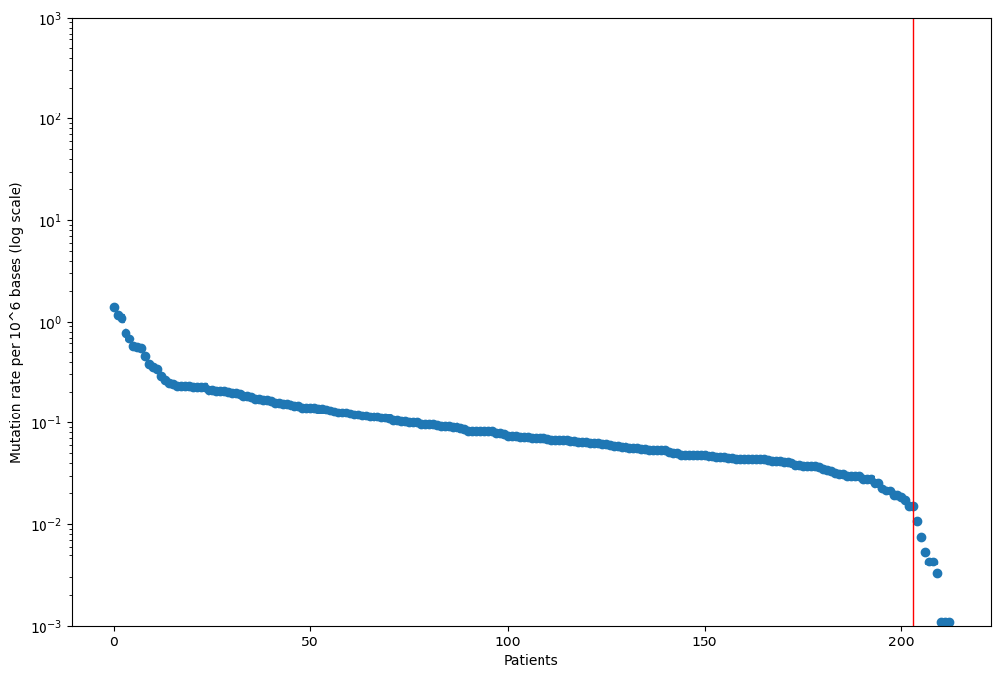

In [75]:
%matplotlib inline
plt.rcParams['figure.figsize'] = (12, 8)
plt.yscale("log") 
#set axes limit
plt.ylim(0.001, 1000)
plt.scatter(patients, mutation_rate)
plt.axvline(x=203, color='red', linestyle='-', linewidth = 1, label='x = 203')
plt.xlabel("Patients")
plt.ylabel("Mutation rate per 10^6 bases (log scale)")
plt.show()

In [76]:
array_mutation_rate = np.array(patient_mutation_rate['Mutation_rate*10^6'])
array_mutation_rate

array([1.38723737e+00, 1.15351803e+00, 1.08350993e+00, 7.72243164e-01,
       6.86079352e-01, 5.67604111e-01, 5.60064777e-01, 5.36369729e-01,
       4.53437060e-01, 3.75889629e-01, 3.52194581e-01, 3.36038866e-01,
       2.89725817e-01, 2.64953721e-01, 2.47720959e-01, 2.41258673e-01,
       2.32642292e-01, 2.32642292e-01, 2.31565244e-01, 2.29411149e-01,
       2.26180006e-01, 2.25102958e-01, 2.25102958e-01, 2.25102958e-01,
       2.13255434e-01, 2.13255434e-01, 2.08947244e-01, 2.08947244e-01,
       2.07870196e-01, 2.03562006e-01, 1.98176767e-01, 1.97099720e-01,
       1.91714481e-01, 1.86329243e-01, 1.83098100e-01, 1.82021053e-01,
       1.74481719e-01, 1.72327624e-01, 1.70173528e-01, 1.68019433e-01,
       1.66942385e-01, 1.58326004e-01, 1.57248957e-01, 1.56171909e-01,
       1.54017814e-01, 1.50786671e-01, 1.47555528e-01, 1.46478480e-01,
       1.42170290e-01, 1.42170290e-01, 1.42170290e-01, 1.41093242e-01,
       1.37862099e-01, 1.36785051e-01, 1.35708004e-01, 1.32476861e-01,
      

In [77]:
np.array(np.log10(patient_mutation_rate['Mutation_rate*10^6']))

array([ 0.14215078,  0.06202439,  0.0348329 , -0.11224593, -0.16362565,
       -0.24595447, -0.25176174, -0.27053574, -0.34348299, -0.42493966,
       -0.45321733, -0.47361049, -0.5380128 , -0.57682998, -0.60603725,
       -0.61751706, -0.63331133, -0.63331133, -0.63532662, -0.63938548,
       -0.64554579, -0.6476188 , -0.6476188 , -0.6476188 , -0.67109989,
       -0.67109989, -0.67996335, -0.67996335, -0.68220777, -0.69130328,
       -0.70294726, -0.70531399, -0.71734508, -0.72971898, -0.73731616,
       -0.73987838, -0.75825007, -0.7636451 , -0.769108  , -0.77464048,
       -0.77743339, -0.80044775, -0.80341223, -0.80639708, -0.81242905,
       -0.82163705, -0.83104452, -0.83422617, -0.84719115, -0.84719115,
       -0.84719115, -0.85049379, -0.86055511, -0.86396136, -0.86739454,
       -0.87785997, -0.88858384, -0.89957922, -0.89957922, -0.90330709,
       -0.90706724, -0.91468664, -0.9224421 , -0.9263724 , -0.93033859,
       -0.93434133, -0.94245922, -0.94245922, -0.94657578, -0.95

### Study of the thresholds using KneeLocator

In [78]:
colonne_iper = ['Studio', 'x_max', 'mutation rate x_max', 'x_max+1', 'mutation_rate x_max+1', 'gap']
df_soglia_iper = pd.DataFrame(columns = colonne_iper)

In [79]:
y_Lefebvre2 = np.array(patient_mutation_rate['Mutation_rate*10^6'])

210
dx_3: 209
yx_3: -2.4906438285041057
dx_4: 210
yx_4: -2.967765083223768
gap_max 0.47712125471966216
dim_finale_x_sx: 209
dim_inizio_y_sx: 4
[  0   1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17
  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35
  36  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53
  54  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71
  72  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89
  90  91  92  93  94  95  96  97  98  99 100 101 102 103 104 105 106 107
 108 109 110 111 112 113 114 115 116 117 118 119 120 121 122 123 124 125
 126 127 128 129 130 131 132 133 134 135 136 137 138 139 140 141 142 143
 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161
 162 163 164 165 166 167 168 169 170 171 172 173 174 175 176 177 178 179
 180 181 182 183 184 185 186 187 188 189 190 191 192 193 194 195 196 197
 198 199 200 201 202 203 204 205 206 207 208]
[ 0.1421

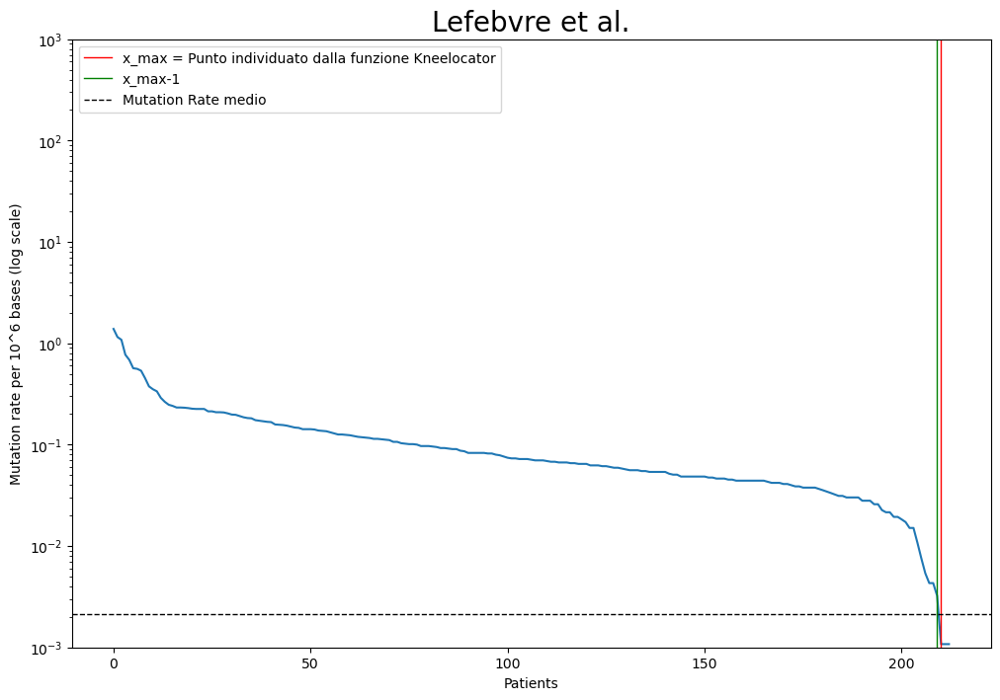

In [80]:
from kneed import KneeLocator, DataGenerator as dg

x_Lefebvre=patients
y_Lefebvre=np.array(np.log10(patient_mutation_rate['Mutation_rate*10^6']))

#punto di destra
kl = KneeLocator(x_Lefebvre, y_Lefebvre, S=0.1, curve="convex", direction="decreasing", online = True)
print(kl.knee)

x4 = kl.knee #primo punto che si trova considerando l'intera curva
y4 = y_Lefebvre[x4]
x3 = kl.knee -1 # x3 è minore di x4; visto che la funzione è decrescente y3 sarà maggiore di y4
y3 = y_Lefebvre[x3]
dim_inizio_x = 0
dim_finale_x = len(x_Lefebvre)
dim_inizio_y = 0
dim_finale_y = len(y_Lefebvre) 

print('dx_3:', x3)   
print('yx_3:', y3)   
print('dx_4:', x4)   
print('yx_4:', y4)   

gap_max_Lefebvre = abs(y4 - y3) # visto che la funzione è decrescente. Il gap si riferisce alla ripidità della curva.
print('gap_max', gap_max_Lefebvre) 
x_max_Lefebvre = x3

dim_finale_x = x3
print('dim_finale_x_sx:', dim_finale_x)   
dim_inizio_y = dim_finale_y - x3    # !! In questo modo, i sub-intervalli considerati sia per x che per y sono uguali
print('dim_inizio_y_sx:', dim_inizio_y)   

x_sub = x_Lefebvre[0:dim_finale_x] 
y_sub = y_Lefebvre[0:x3] 
# x_sub e y_sub hanno la stessa lunghezza

print(x_sub)
print(y_sub)

while (dim_finale_x > 5): # Questo limite (1) può variare in base al dataset
    kl = KneeLocator(x_sub, y_sub, S=0.1, curve="convex", direction="decreasing", online = True)
    print(kl.knee)

    x4 = kl.knee
    y4 = y_Lefebvre[x4]
    x3 = kl.knee - 1
    y3 = y_Lefebvre[x3]

    print('dx_3:', x3)   
    print('yx_3:', y3)
    print('dx_4:', x4)
    print('yx_4:', y4)

    gap = abs(y4 - y3) # essendo la funzione decrescente, se x4 > x3, allora y4 < y3 
    print('gap', gap)

    if gap > gap_max_Lefebvre: # aggiorna il gap massimo!!!
        gap_max_Lefebvre = gap
        print('gap_max:',gap_max_Lefebvre)
        x_max_Lefebvre = x4  # x4 > x3
        print('x:', x_max_Lefebvre)
    

    dim_finale_x = x3
    print('dim_finale_x:', dim_finale_x)
    dim_inizio_y = dim_finale_y - x3
    print('dim_inizio_y:', dim_inizio_y)

    x_sub = x_Lefebvre[0:dim_finale_x]
    y_sub = y_Lefebvre[0:x3]

    print(x_sub)
    print(y_sub)

y_max_Lefebvre_inf = array_mutation_rate[x_max_Lefebvre+1]
y_max_Lefebvre_sup = array_mutation_rate[x_max_Lefebvre]
y_max_Lefebvre_avg = (y_max_Lefebvre_inf + y_max_Lefebvre_sup)/2
y_grafico_media = (y_Lefebvre[x_max_Lefebvre]+y_Lefebvre[x_max_Lefebvre-1])/2
print('gap_max:',gap_max_Lefebvre)
print('x:',x_max_Lefebvre)
print('mutation rate inf:', y_max_Lefebvre_inf)
print('mutation rate sup:', y_max_Lefebvre_sup)
print('mutation rate avg:', y_max_Lefebvre_avg)
fig = plt.figure(figsize=(12, 8))
plt.plot(patients, mutation_rate)
plt.yscale("log")
plt.xlabel("Patients")
plt.ylabel("Mutation rate per 10^6 bases (log scale)")
plt.title ("Lefebvre et al.",fontsize=20)
plt.axvline(x=x_max_Lefebvre+1, color='red', linestyle='-', linewidth = 1,  label = 'x_max = Punto individuato dalla funzione Kneelocator')
plt.axvline(x=x_max_Lefebvre, color='green', linestyle='-', linewidth = 1, label = 'x_max-1')
plt.axhline(y=y_max_Lefebvre_avg, color='black', linestyle='--', linewidth = 1, label = 'Mutation Rate medio')
plt.legend()
#set axes limit
plt.ylim(0.001, 1000)
plt.show()

#'Studio', 'x_max', 'mutation rate x_max', 'x_max+1', 'mutation_rate x_max+1', 'gap'
#df_soglia_iper = df_soglia_iper.append({'Studio': 'Lefebvre et al.', 'x_max': x_max_Lefebvre, 'mutation rate x_max':y_max_Lefebvre_sup,  'x_max+1': x_max_Lefebvre+1, 'mutation_rate x_max+1': y_max_Lefebvre_inf,'gap': gap_max_Lefebvre }, ignore_index=True)

### Manual study of the thresholds

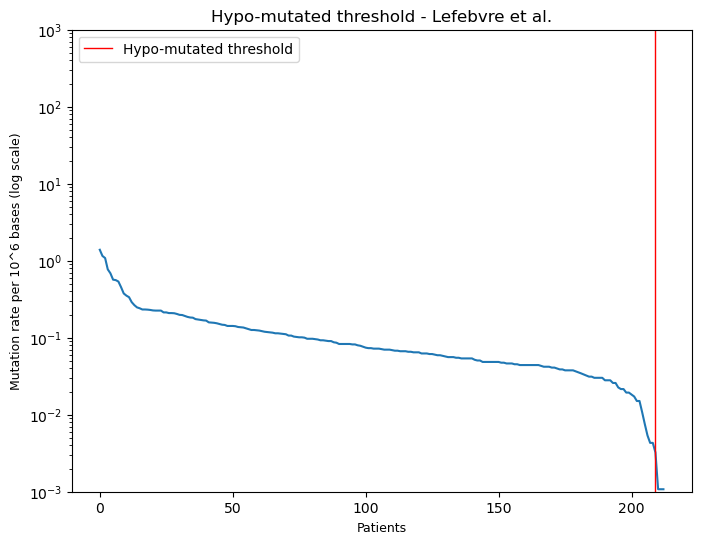

In [82]:
%matplotlib inline

plt.rcParams['figure.figsize'] = (8, 6)
plt.yscale("log")
plt.ylim(0.001, 1000)
plt.plot(x_Lefebvre, y_Lefebvre2)
plt.xlabel("Patients", fontsize=9)
plt.ylabel("Mutation rate per 10^6 bases (log scale)", fontsize=9)
#plt.axvline(x=9, color='green', linestyle='-', linewidth=1, label='x = 9')
plt.axvline(x=208.72, color='red', linestyle='-', linewidth=1, label='Hypo-mutated threshold')
#plt.axhline(y=0.0035, color='green', linestyle='-', label='Hyper-mutated threshold')
plt.title("Hypo-mutated threshold - Lefebvre et al.", fontsize=12)
plt.legend()
plt.show()

## Zoom

(0.001077047648254074, 0.018309810020319256)

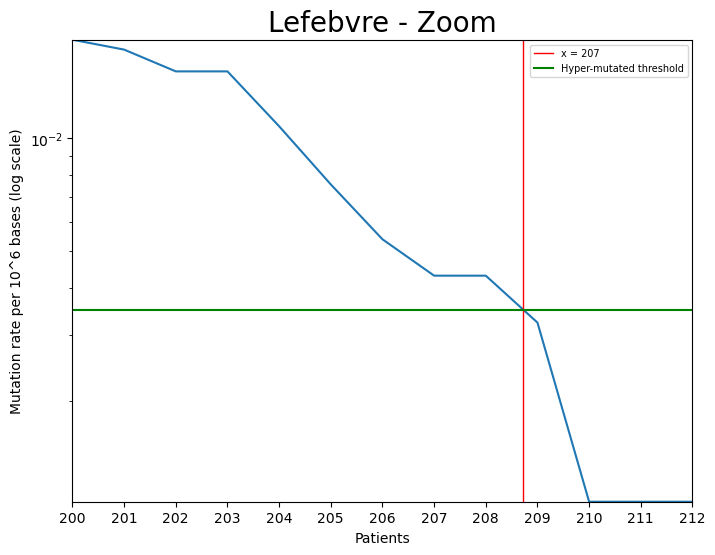

In [83]:
%matplotlib inline
fig = plt.figure(figsize=(8, 6))
plt.plot(patients, mutation_rate)
plt.xticks(np.arange(min(patients), max(patients)+1, 1.0))
plt.yscale("log")
plt.xlabel("Patients")
plt.ylabel("Mutation rate per 10^6 bases (log scale)")
plt.title ("Lefebvre - Zoom",fontsize=20)
x1_Lefebvre, y1_Lefebvre = (patients[200], patient_mutation_rate.loc[200, 'Mutation_rate*10^6'])
x2_Lefebvre, y2_Lefebvre = (patients[212], patient_mutation_rate.loc[212, 'Mutation_rate*10^6'])
plt.axvline(x=208.72, color='red', linestyle='-', linewidth=1, label='x = 207')
plt.axhline(y=0.0035, color='green', linestyle='-', label='Hyper-mutated threshold')
plt.legend(loc='upper right', fontsize = 7)
plt.gca().set_xlim(x1_Lefebvre, x2_Lefebvre)
plt.gca().set_ylim(y2_Lefebvre, y1_Lefebvre)

In [84]:
# create a table containing the iterated values: x3, y3, x4, y4, gap. For each row, one iteration.

x_Lefebvre=patients
y_Lefebvre=np.array(np.log10(patient_mutation_rate['Mutation_rate*10^6']))

#punto di destra
kl = KneeLocator(x_Lefebvre, y_Lefebvre, S=0.1, curve="convex", direction="decreasing", online = True)

x4 = kl.knee #primo punto che si trova considerando l'intera curva
y4 = y_Lefebvre[x4]
x3 = kl.knee -1 # x3 è minore di x4; visto che la funzione è decrescente y3 sarà maggiore di y4
y3 = y_Lefebvre[x3]
dim_inizio_x = 0
dim_finale_x = len(x_Lefebvre) #164
dim_inizio_y = 0
dim_finale_y = len(x_Lefebvre) #164

gap_Lefebvre = abs(y4 - y3) # visto che la funzione è decrescente. Il gap si riferisce alla ripidità della curva.
x_max_Lefebvre = x3

data = [[x4, y4, x3, y3, gap_Lefebvre]] # inizializzo data con il primo risultato di Kneelocator

dim_finale_x = x3
dim_inizio_y = dim_finale_y - x3 # !! In questo modo, i sub-intervalli considerati sia per x che per y sono uguali

x_sub = x_Lefebvre[0:dim_finale_x] # da 0 a 156 --> 156 = lunghezza del vettore
y_sub = y_Lefebvre[0:x3] # da 8 a 164 --> 156 = lunghezza del vettore
# x_sub e y_sub hanno la stessa lunghezza

while (dim_finale_x > 5): # Questo limite (1) può variare in base al dataset
    kl = KneeLocator(x_sub, y_sub, S=0.1, curve="convex", direction="decreasing", online = True)
    
    x4 = kl.knee
    y4 = y_Lefebvre[x4]
    x3 = kl.knee - 1
    y3 = y_Lefebvre[x3]
    gap = abs(y4 - y3) # essendo la funzione decrescente, se x4 > x3, allora y4 < y3 

    data.append([x4, y4, x3, y3, gap])
  
    dim_finale_x = x3
    dim_inizio_y = dim_finale_y - x3
    dim_finale_y = x3
   
    x_sub = x_Lefebvre[0:x3]
    y_sub = y_Lefebvre[0:x3]
    
cols=['x4','y4','x3','y3','gap']
result_KneeLocator = pd.DataFrame(data, columns=cols)  
result_KneeLocator

,x4,y4,x3,y3,gap
0,210,-2.967765,209,-2.490644,0.477121
1,207,-2.365705,206,-2.268795,0.096910
2,202,-1.821637,201,-1.763645,0.057992
3,198,-1.712493,197,-1.666735,0.045757
4,193,-1.587554,192,-1.552792,0.034762
5,190,-1.552792,189,-1.520607,0.032185
6,186,-1.520607,185,-1.505367,0.015240
7,175,-1.423697,174,-1.411463,0.012234
8,170,-1.387981,169,-1.376700,0.011281
9,167,-1.376700,166,-1.365705,0.010995


In [85]:
# save the dataset 
result_KneeLocator.to_csv('Points_foundbyKneeLocator_Lefebvre.csv', index=False, sep=',')

In [86]:
genes_patients=data_mutation_FINAL[['PATIENT_ID', 'Hugo_Symbol']]
genes_patients

,PATIENT_ID,Hugo_Symbol
0,MBC_81,VWA5B1
1,MBC_81,GJB5
2,MBC_81,LPHN2
3,MBC_81,FLG
4,MBC_81,PRSS38
...,...,...
22936,MBC_215,POMT1
22937,MBC_216,NCOR1
22946,MBC_24,RP11-44M6.3
22947,MBC_67,NEBL-AS1


In [87]:
n_of_pts_per_gene = genes_patients.groupby(['Hugo_Symbol'])['PATIENT_ID'].count().reset_index()
n_of_pts_per_gene.rename(columns = {'PATIENT_ID':'Num_pts_per_gene'}, inplace = True)
n_of_pts_per_gene

,Hugo_Symbol,Num_pts_per_gene
0,A1BG,3
1,A1CF,2
2,A2M,5
3,A2ML1,3
4,A3GALT2,1
...,...,...
10814,ZXDA,1
10815,ZXDB,1
10816,ZXDC,1
10817,ZYX,1


In [88]:
# the total number of patients is 213
tot_pts = 213
tot_pts

213

In [89]:
# add a column to the n_of_pts_per_gene dataframe representing the mutation frequency for each gene
n_of_pts_per_gene["Mutation_frequency (%)"] = (n_of_pts_per_gene["Num_pts_per_gene"]*100)/tot_pts
# the numbers of patients per gene are sorted in descending order
n_of_pts_per_gene = n_of_pts_per_gene.sort_values(by="Num_pts_per_gene", ascending=False)
n_of_pts_per_gene

,Hugo_Symbol,Num_pts_per_gene,Mutation_frequency (%)
9619,TP53,89,41.784038
6921,PIK3CA,76,35.680751
9843,TTN,72,33.802817
8048,RYR2,34,15.962441
3554,GATA3,29,13.615023
...,...,...,...
2423,DEF8,1,0.469484
2424,DEFA5,1,0.469484
2425,DEFB116,1,0.469484
7151,PPAPDC3,1,0.469484


In [90]:
gene_mutation_frequency = n_of_pts_per_gene[['Hugo_Symbol', 'Mutation_frequency (%)']]
# select the first 50 genes
highest_mutated_genes=gene_mutation_frequency.head(50)
highest_mutated_genes

,Hugo_Symbol,Mutation_frequency (%)
9619,TP53,41.784038
6921,PIK3CA,35.680751
9843,TTN,33.802817
8048,RYR2,15.962441
3554,GATA3,13.615023
5299,MAP3K1,12.206573
5735,MUC16,11.267606
2977,ESR1,11.267606
10702,ZNF687,10.328638
9070,SYNE1,10.328638


In [91]:
mutated_gene_names=highest_mutated_genes['Hugo_Symbol'].tolist()

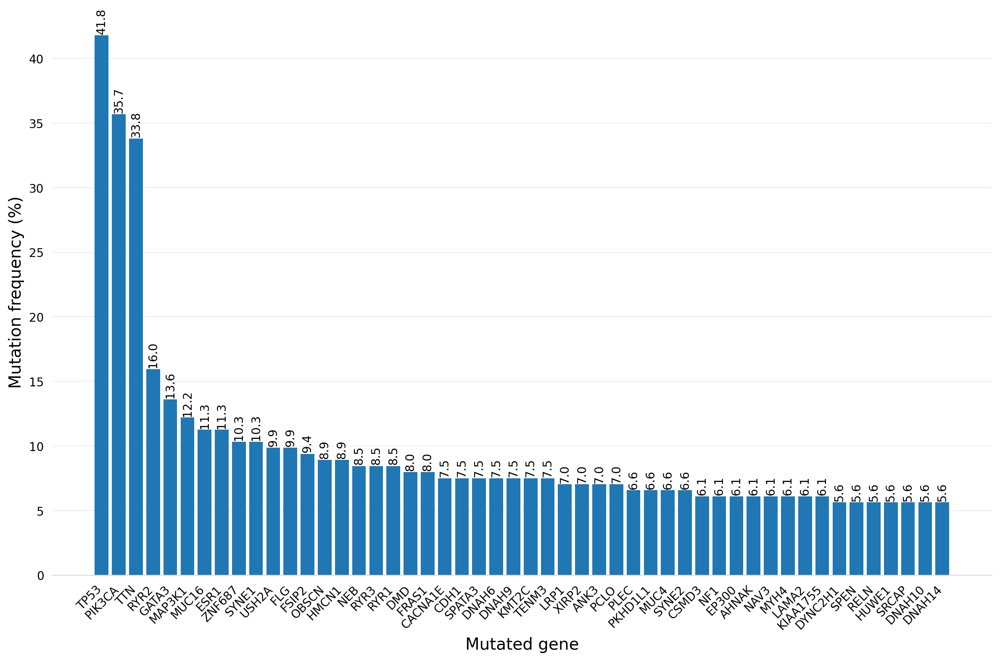

In [92]:
# increase the quality and resolution of the chart
from IPython.display import set_matplotlib_formats
import matplotlib_inline.backend_inline

matplotlib_inline.backend_inline.set_matplotlib_formats('retina')
# set default figure size.
plt.rcParams['figure.figsize'] = (12, 8)
fig, ax = plt.subplots()
h=ax.bar(highest_mutated_genes['Hugo_Symbol'], highest_mutated_genes['Mutation_frequency (%)'], label=mutated_gene_names)
xticks_pos = [0.65*patch.get_width() + patch.get_xy()[0] for patch in h]

_ = plt.xticks(xticks_pos, mutated_gene_names,  ha='right', rotation=45)
#plt.title('Highest mutated genes', fontsize=14)
plt.xlabel('Mutated gene', fontsize=14)
plt.ylabel('Mutation frequency (%)', fontsize=14)


# First, let's remove the top, right and left spines (figure borders)
# which really aren't necessary for a bar chart.
# Also, make the bottom spine gray instead of black.
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.spines['bottom'].set_color('#DDDDDD')

# Second, remove the ticks as well.
ax.tick_params(bottom=False, left=False)

# Third, add a horizontal grid (but keep the vertical grid hidden).
# Color the lines a light gray as well.
ax.set_axisbelow(True)
ax.yaxis.grid(True, color='#EEEEEE')
ax.xaxis.grid(False)

# Add text annotations to the top of the bars.
# Note, you'll have to adjust this slightly (the 0.3)
# with different data.
for bar in h:
  ax.text(
      bar.get_x() + bar.get_width() / 2,
      bar.get_height() + 0.3,
      round(bar.get_height(), 1),
      rotation='vertical',
      horizontalalignment='center'
  )


fig.tight_layout()